#Assignment Requirements:

I am asked to predict which couriers will or will not work in the next 3 weeks, for a week in advance. To create a variable for this problem the ask asks to look at the data from weeks, 9, 10 and 11 and if any of the data in these weeks is provided, then the courier gets assigned 1, if not it gets assigned 0. Data for weeks 9, 10 and 11 is then removed to avoid bias. Week 8 is also removed because we are asking for predictions for a week in advance. 

I also need to perform a complete Exploratory Data Analysis: univariate, bivariate and timing analysis, explore correlations between features and between features and labels and explain any interesting findings. 

Model needs to perform betetr than chance. 



#Packages and Files
Packages and files to install and import

### Installation of packages 
(Google Colab)

In [ ]:
!pip install tpot

     |████████████████████████████████| 81kB 7.3MB/s 
     |████████████████████████████████| 153kB 27.9MB/s 
  Created wheel for stopit: filename=stopit-1.1.2-cp36-none-any.whl size=11955 sha256=74c03cf38cb6a09300ec2360bd20c764b2ff9d34c0eff19e0654b456d5290075
  Stored in directory: /root/.cache/pip/wheels/3c/85/2b/2580190404636bfc63e8de3dff629c03bb795021e1983a6cc7
Successfully built stopit


In [ ]:
!pip install eli5

     |████████████████████████████████| 112kB 9.7MB/s 


In [ ]:
!pip install shap

     |████████████████████████████████| 266kB 8.2MB/s 
  Created wheel for shap: filename=shap-0.31.0-cp36-cp36m-linux_x86_64.whl size=375011 sha256=d3574c57323341d7068504fb64a215b1c2c49fed03684a18c8e4a2e6cfa3b836
  Stored in directory: /root/.cache/pip/wheels/7b/2d/46/ff8959add2e4e99a18a6e90b82f47508bf52fdf7e7d806f7df
Successfully built shap


### Importing the main packages and Datasets

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


In [ ]:
lifetime_data = '/gdrive/My Drive/Courier_lifetime_data.csv'
weekly_data = '/gdrive/My Drive/Courier_weekly_data.csv'

lifetime_data_df_start = pd.read_csv(lifetime_data)
weekly_data_df_start = pd.read_csv(weekly_data)

#Data Exploration 

- Loading the data frame to see the type of data we have.
- Data statistics
- shape/size of the data frames

In [ ]:
lifetime_data_df_start.head()

,courier,feature_1,feature_2
0,208,a,25.0
1,218,c,0.0
2,225,c,NaN
3,231,c,0.0
4,242,c,NaN


In [ ]:
weekly_data_df_start.head()

,courier,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17
0,3767,2,6,34,38,0.0789,0.9211,140.4737,0.1316,2162.4737,0.7632,7.340776,8,20.208158,5.236316,0.8158,43.384804,1,19
1,3767,4,-1,42,37,0.0000,1.0000,135.5946,0.0811,2097.4054,0.9459,11.883784,19,18.855405,5.689459,0.8919,35.078042,3,11
2,3767,5,24,41,43,0.0233,0.9767,131.0930,0.0233,2043.8837,0.9302,7.072100,16,18.925116,5.138605,0.9302,31.455285,1,10
3,3767,6,-22,65,66,0.0606,0.9394,120.1515,0.0000,2124.2727,0.7727,7.356567,33,18.259697,4.704394,0.7879,34.252991,1,30
4,6282,2,9,33,27,0.0741,0.9259,100.0000,0.0370,4075.7407,0.8889,8.501233,5,26.863704,4.828519,0.8889,46.478114,1,4


In [ ]:
#shape of the dataframes
print("Lifetime dataframe:", lifetime_data_df_start.shape, "Weekly dataframe:", weekly_data_df_start.shape)

Lifetime dataframe: (7524, 3) Weekly dataframe: (4117, 19)


In [ ]:
#Checking if lifetime data includes data for all couriers found in the weekly dataset.

print("Number of unique couriers in Weekly dataframe is ", len(weekly_data_df_start['courier'].unique()))
    

weekly = list(weekly_data_df_start['courier'])
lifetime = list(lifetime_data_df_start['courier'])

print("Number of couriers from weekly dataset also found in lifetime dataset:", len(list(set(weekly).intersection(lifetime))))


Number of unique couriers in Weekly dataframe is  759
Number of couriers from weekly dataset also found in lifetime dataset: 759


In [ ]:
#dropping courier and week columns and looking at descriptive stats of the features,
#courier and week data from the table are not useful, they both represent "categories".

weekly_data_df_start.describe()

,courier,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17
count,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.000000,4117.00000
mean,366530.934418,4.910857,-3.702453,44.232208,55.691037,0.068610,0.931390,104.331502,0.059339,3975.807328,0.767527,9.619359,20.266942,20.000994,5.211435,0.782381,68.655642,2.255526,12.78941
std,128603.611959,3.364852,17.407331,24.007116,31.666550,0.068999,0.068999,8.473348,0.064646,1237.055134,0.136458,1.827863,12.460020,3.205479,0.961980,0.164578,18.828885,1.542969,11.69108
min,3767.000000,0.000000,-138.000000,1.000000,1.000000,0.000000,0.000000,92.857100,0.000000,1136.750000,0.000000,2.575000,0.000000,5.416667,3.270000,0.000000,2.957809,1.000000,1.00000
25%,280239.000000,2.000000,-12.000000,26.000000,31.000000,0.018500,0.901200,100.000000,0.000000,2750.977800,0.693700,8.424751,11.000000,18.168824,4.570099,0.739100,57.839947,1.000000,5.00000
50%,406936.000000,5.000000,-2.000000,41.000000,51.000000,0.054100,0.945900,100.465100,0.043500,4099.425000,0.785700,9.497961,19.000000,19.648810,5.072500,0.822200,71.653595,2.000000,10.00000
75%,467727.000000,8.000000,6.000000,59.000000,76.000000,0.098800,0.981500,104.766000,0.088200,4774.028200,0.864200,10.607692,28.000000,21.335395,5.618522,0.883700,82.180556,3.000000,17.00000
max,519341.000000,11.000000,77.000000,169.000000,189.000000,1.000000,1.000000,197.739100,0.666700,12593.900000,1.000000,20.546667,86.000000,66.400000,12.546923,1.000000,180.861111,13.000000,195.00000


As we can see all features, except the feature_1 have positive metrics. The minimum value found in feature one (denoted as min in the table above) is -138. The data for weeks when couriers did not work is missing, so for those parts we will use negative value that is much bigger than -138 or NaN, so that the model won't confuse it with 
the actual data.

In [ ]:
lifetime_data_df_start.describe()

#feature 1 is categorical and is not included, courier data, again, doesn't tell us anything as it represents labels of couriers.  

,courier,feature_2
count,7524.000000,6588.000000
mean,518864.440324,26.373862
std,286880.574472,22.703621
min,208.000000,-61.000000
25%,275875.750000,20.000000
50%,529366.500000,25.000000
75%,803120.500000,32.000000
max,964240.000000,954.000000


Value counts for feature_1:
b    4456
a    2516
d     467
c      85
Name: feature_1, dtype: int64


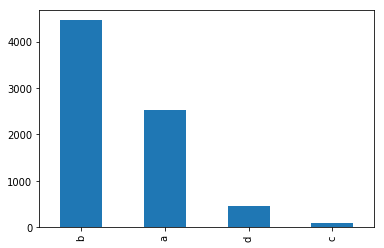

In [ ]:
# looking at feature 1: y axis represents the number of times each feature appears in the column.
# we only see that feature of value b is the most abundant and that there are a lot of 'a's
# and very few 'b's and 'c's. 

print("Value counts for feature_1:")
print(lifetime_data_df_start["feature_1"].value_counts())

ax = lifetime_data_df_start["feature_1"].value_counts().plot.bar()

##outliers


To determine which data points are outliers, I'll look if a value is a certain numer of standard deviations away from the mean. This values is usually 3 standard deviations away. Some outliers might not be detected as if there are many
they can drastically increase the standard deviation and influence the results. 


In [ ]:
unique_courier = len(weekly_data_df_start['courier'].unique())
print("We have", unique_courier, "of unique courier numbers in the data set.")

We have 759 of unique courier numbers in the data set.


In [ ]:
#setting courier numbers and week numbers as index, so they don't get taken into account when looking for outliers. 
weekly_data_df_start = weekly_data_df_start.set_index(['courier','week'])

#removing data points that are more than 3 std away. 
weekly_data_df = weekly_data_df_start[weekly_data_df_start.apply(lambda x :(x-x.mean()).abs()<(3*x.std()) ).all(1)]

print(weekly_data_df.shape, weekly_data_df_start.shape)
weekly_data_df=weekly_data_df.reset_index()

weekly_data_df.head()

(3433, 17) (4117, 17)


,courier,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17
0,3767,6,-22,65,66,0.0606,0.9394,120.1515,0.0000,2124.2727,0.7727,7.356567,33,18.259697,4.704394,0.7879,34.252991,1,30
1,6282,2,9,33,27,0.0741,0.9259,100.0000,0.0370,4075.7407,0.8889,8.501233,5,26.863704,4.828519,0.8889,46.478114,1,4
2,6282,3,-20,42,56,0.0536,0.9464,113.4821,0.0357,4777.0714,0.9107,8.210125,16,23.651786,5.553571,0.9107,79.407407,2,5
3,6282,4,9,22,32,0.1250,0.8750,105.0000,0.0938,5744.1875,0.8125,8.285422,12,18.180937,5.834375,0.7813,87.250000,1,2
4,6282,5,21,31,48,0.0417,0.9583,117.2500,0.0833,4011.7708,0.9167,9.768052,17,20.346667,5.615417,0.9167,85.083333,2,9


In [ ]:
dfDummies = pd.get_dummies( lifetime_data_df_start['feature_1'], prefix = 'cat')
df_onehot = pd.concat([lifetime_data_df_start, dfDummies], axis=1)
df_onehot = df_onehot.drop(['feature_1'], axis = 1)

df_onehot = df_onehot.set_index(['courier'])

lifetime_data_df = df_onehot[df_onehot.apply(lambda x :(x-x.mean()).abs()<(3*x.std()) ).all(1)]
print(lifetime_data_df.shape, df_onehot.shape)

lifetime_data_df = lifetime_data_df.reset_index()
lifetime_data_df.head()

(6127, 5) (7524, 5)


,courier,feature_2,cat_a,cat_b,cat_c,cat_d
0,208,25.0,1,0,0,0
1,2007,24.0,1,0,0,0
2,3767,33.0,0,1,0,0
3,6101,51.0,1,0,0,0
4,6282,35.0,1,0,0,0


### Plots

**Scatter Plots**

The plots below are scatter plots of features' data. We can see that the data points are 
close together with some point diverging from the main group. This points are most probably just 
variance in the data and not the outliers(outliers have already been removed, although their treshold
could be changed). From the scatter plots below we can also see that feature 16 includes only numbers 1-6.



**Histograms/Distributions**

Features 1, 10, 12, 13 and 15 look normally distributed
Features 2, 8, 3, 11 and 14 are slightly left skewed
Features 4, 7 and 17 are left skewed
Features 5 is right skewed
Feature 9 is slightly eight skewed
Feature 16 is left skewed and has only 6 different values (1-6)




**Boxplots**

Boxplots are showing minimum on the bottom and maximum on top. The black
circles are considered outliers, however there seem to be quire a few on all
of the plots and removing them most probably will not help the prediction.
It'll maybe be worth removing some of them if the classifiers won't perform well.
the line in the box is the median and the box represents interquartile range. 
boxplots show the same type of distributions as seen from histograms. 


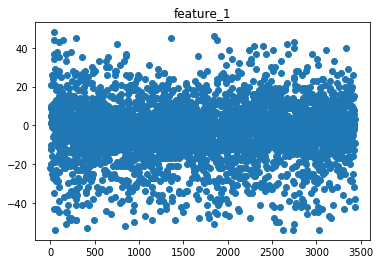

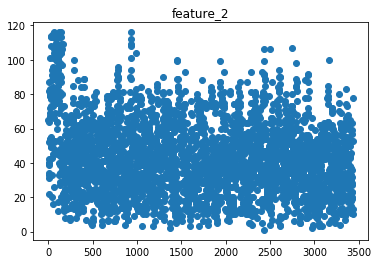

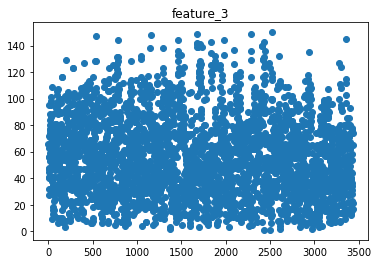

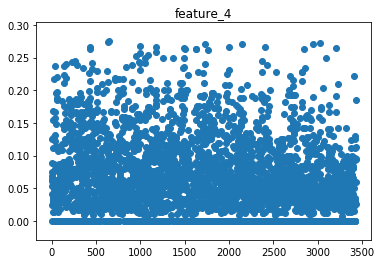

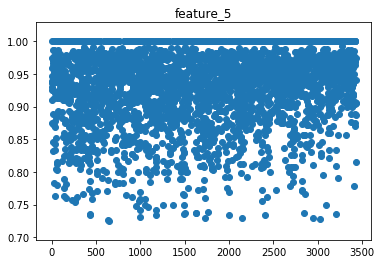

...

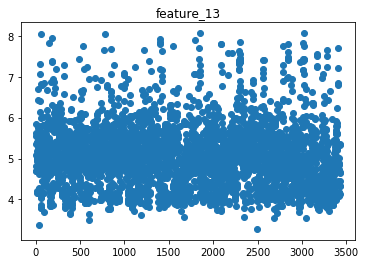

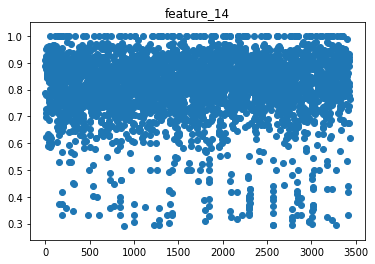

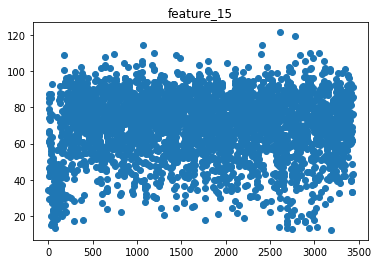

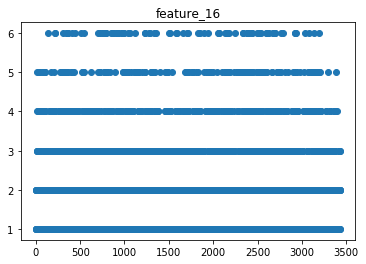

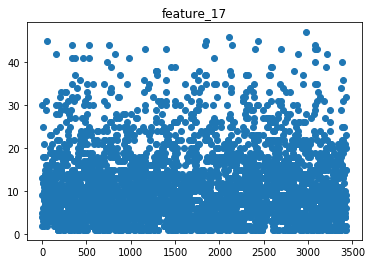

In [ ]:
n_columns = weekly_data_df.shape[1]
for i in range(1, n_columns-1):
  name="feature_{}".format(i)
  fig = plt.figure()
  ax = fig.add_subplot(1, 1, 1)
  ax.set_title(name)
  ax.scatter(range(len(weekly_data_df[name])), weekly_data_df[name])
  
  
  

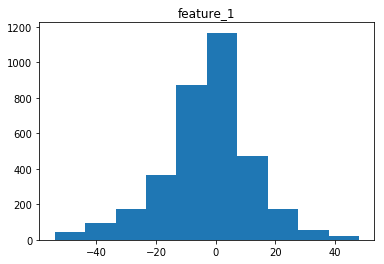

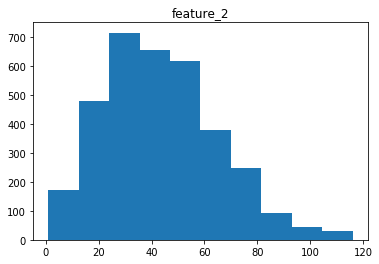

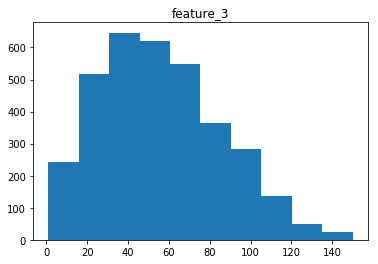

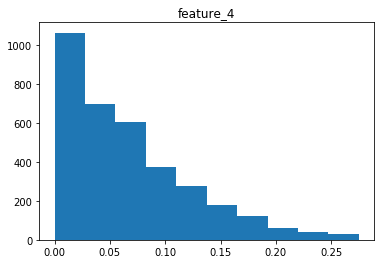

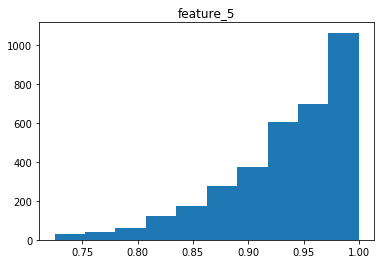

...

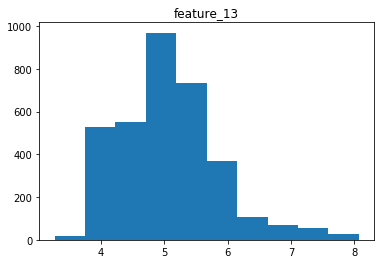

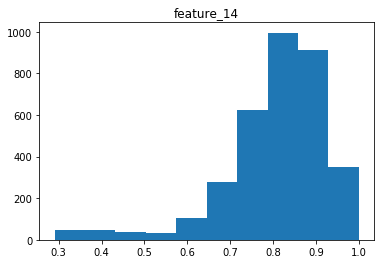

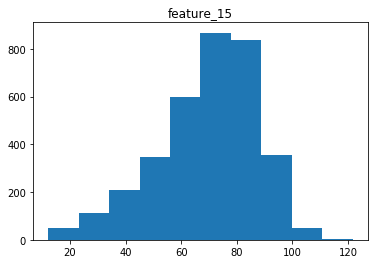

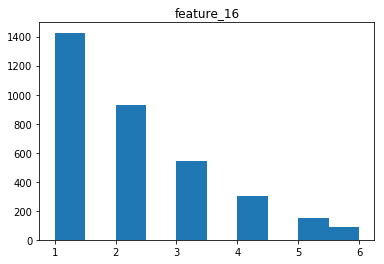

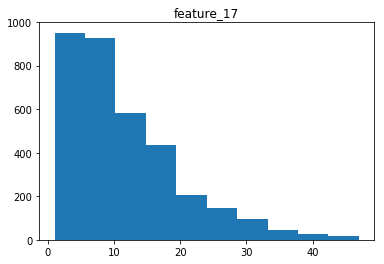

In [ ]:
n_columns = weekly_data_df.shape[1]
for i in range(1, n_columns-1):
  name="feature_{}".format(i)
  fig = plt.figure()
  ax = fig.add_subplot(1, 1, 1)
  ax.set_title(name)
  ax.hist(weekly_data_df[name])
  


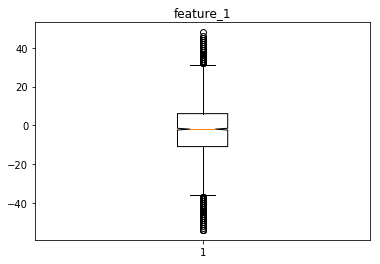

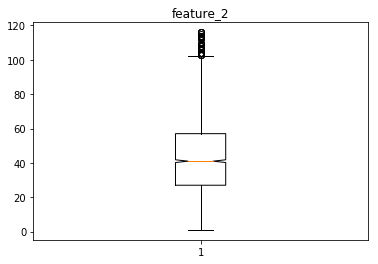

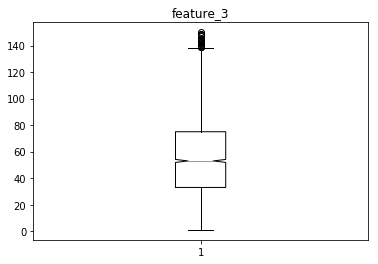

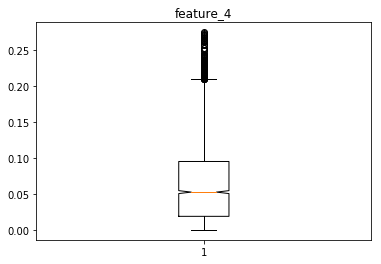

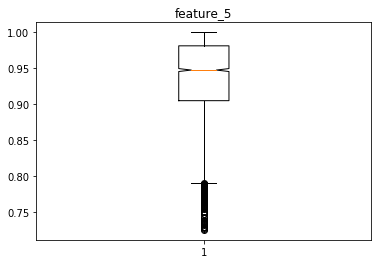

...

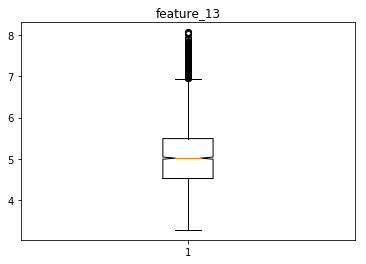

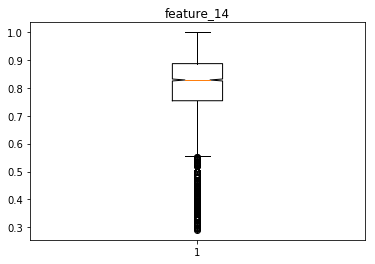

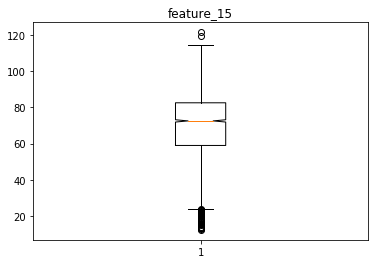

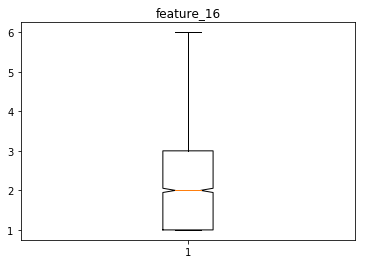

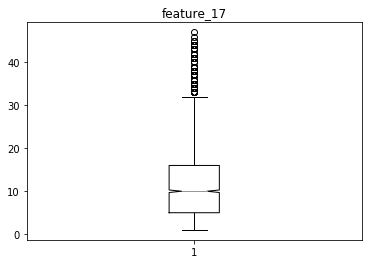

In [ ]:
n_columns = weekly_data_df.shape[1]
for i in range(1, n_columns-1):
  name="feature_{}".format(i)
  fig = plt.figure()
  ax = fig.add_subplot(1, 1, 1)
  ax.set_title(name)
  ax.boxplot(weekly_data_df[name], range(weekly_data_df.shape[0]))
  



##Pair plot
Looking for correlations between features.
As there are many features, I thought the best way to see if any of them show any correlations is to create a pair plot as all of the features are compared amongst each other. (Pairplots done for each week are at the end of the notebook)

Feature pairs (13,8), (2, 11), (3, 11) and (2,3) are showing some correlation.


It is also worthy to note that features 4, 14 and 9 have different distributions during different weeks. In most other cases these distributions are fairly similar. 

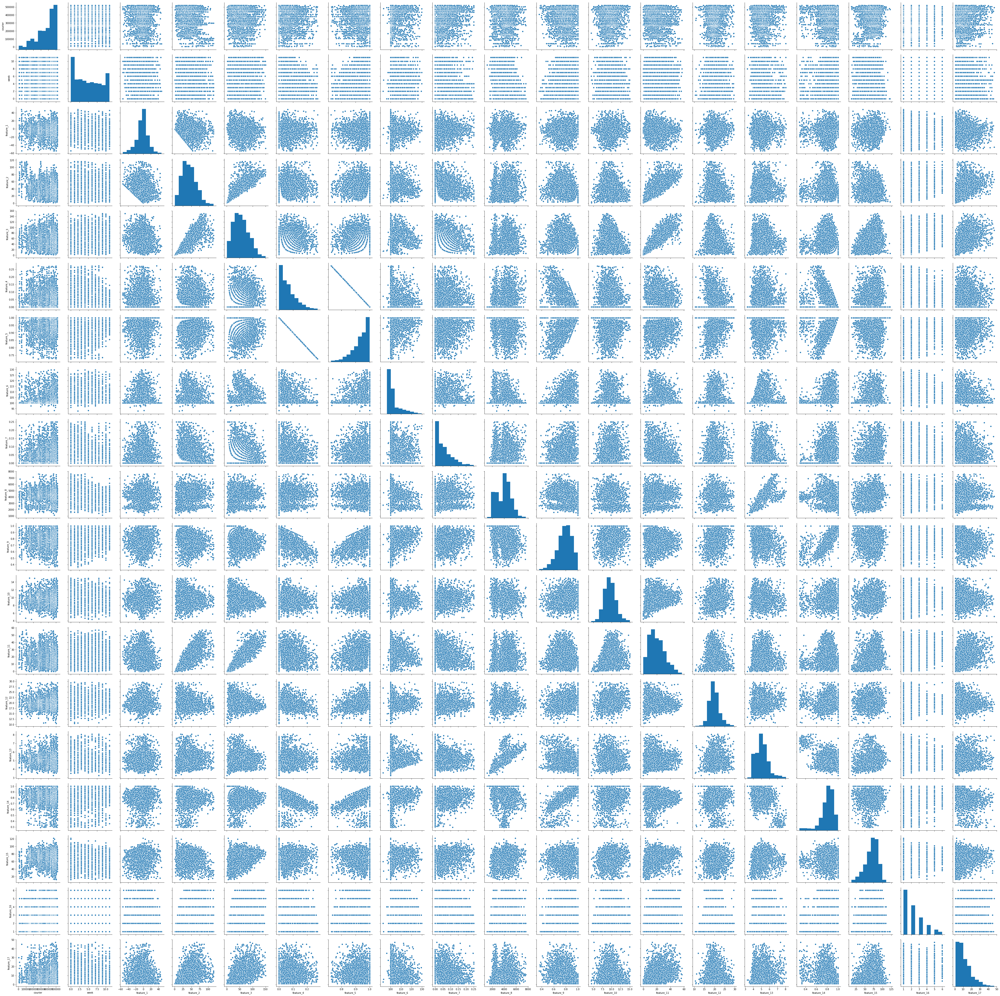

In [ ]:
plot2 = sns.pairplot(weekly_data_df, height=3)
plot2

####Time series

Timeseries plots show us how values change over weeks.  


Features 13, 10, 8, 7, 4 and 1 are getting lower as weeks go by. 
Features 14, 9 and 5 are getting higher as weeks go by. 

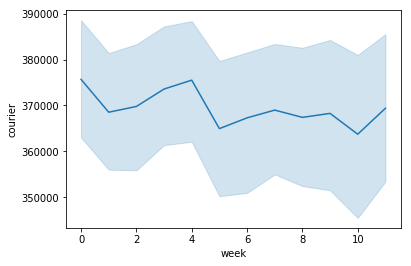

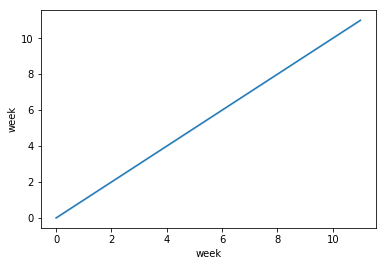

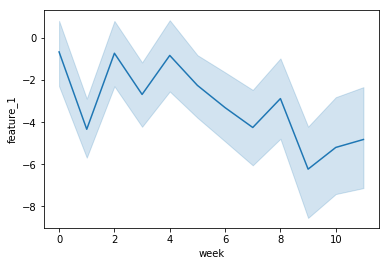

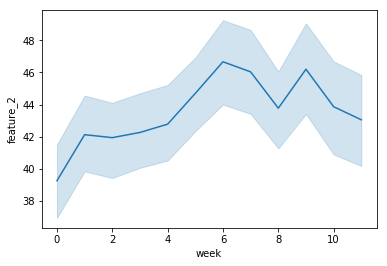

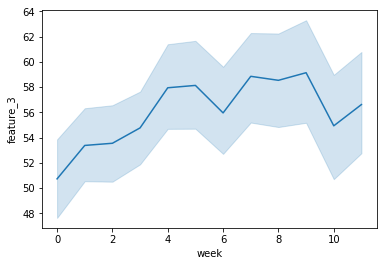

...

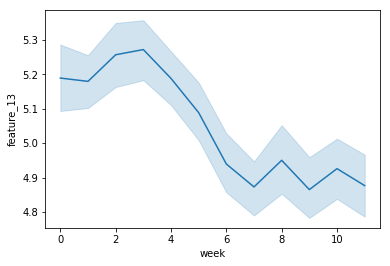

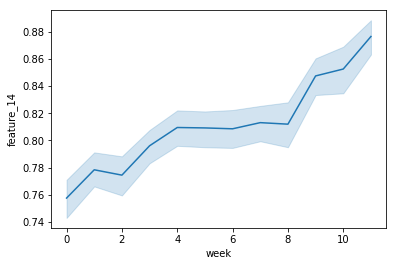

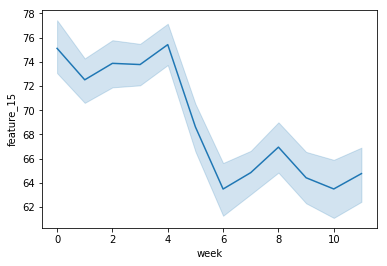

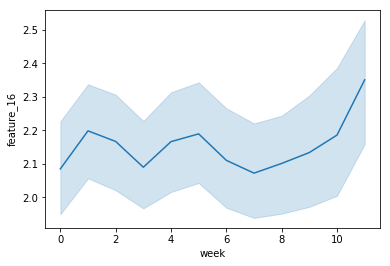

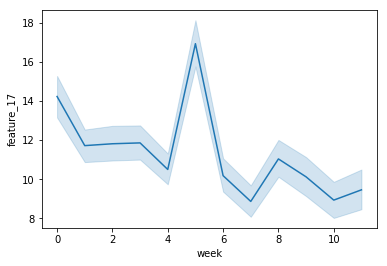

In [ ]:
for i, col in enumerate(weekly_data_df.columns):
    plt.figure(i)
    sns.lineplot(x='week', y = col, data=weekly_data_df)

#TASK 1 : Exploratory Analysis and Data Munging


## Creating Target Variable

In [ ]:
#creating a dictionary where keys are courier numbers and values are either 0 - not churned and 1 - churned. 

courier_labels = {}
for courier in weekly_data_df['courier']:
  
    courier_weeks =  weekly_data_df[weekly_data_df["courier"] == courier]["week"].values
    if 9 in courier_weeks or 10 in courier_weeks or 11 in courier_weeks:
        courier_labels[courier] = 0
    else:
        courier_labels[courier] = 1
    
#checking if the data set is balanced - it is as both values 0 and 1 are fairly equal. 

print("Courier labels created:", len(courier_labels))
print("number of '0' labels:", list(courier_labels.values()).count(0))
print("number of '1' labels:",list(courier_labels.values()).count(1))
print("outlier removed in previous step:", unique_courier - len(courier_labels))


Courier labels created: 700
number of '0' labels: 364
number of '1' labels: 336
outlier removed in previous step: 59


In [ ]:
#Because the data is taken over time we insert missing rows of data (as nan) 
#for every week where there is no data, so we can create one vector for each
#courier and have the same number of columns that are in chronological order.

df = weekly_data_df

df_left = pd.DataFrame(np.array([1,2,3,4,5,6,7,8,9,10,11]), columns = ['week'])
df_out = df.groupby('courier', as_index=False).apply(lambda x: x.merge(df_left, how='right', on='week'))

df_out['courier'] = df_out['courier'].fillna(method='ffill')
df_out = df_out.reset_index(drop=True).sort_values(by=['courier','week'])

df_out.head()
df_out.shape

(7700, 19)

##Creating datasets


In [ ]:
#remove weeks 8, 9, 10, 11
#reseting index so it's in order

weekly_data_df_2 = df_out[df_out['week'] < 8]
weekly_data_df_2 = weekly_data_df_2.reset_index(drop=True)

In [ ]:
#separating data into seperate weeks to use later and to create one row per curier

df = weekly_data_df_2

df1 = df.loc[df['week'] == 1]
df2 = df.loc[df['week'] == 2]
df3 = df.loc[df['week'] == 3]
df4 = df.loc[df['week'] == 4]
df5 = df.loc[df['week'] == 5]
df6 = df.loc[df['week'] == 6]
df7 = df.loc[df['week'] == 7]

print('Shapes of created weekly dataframes:', df1.shape, df2.shape, df3.shape, df4.shape, df5.shape, df6.shape, df7.shape)

Shapes of created weekly dataframes: (700, 19) (700, 19) (700, 19) (700, 19) (700, 19) (700, 19) (700, 19)


In [ ]:
for i, df in enumerate([df1, df2, df3, df4, df5, df6, df7]):
    idxs = [i for  i in range(df.shape[0])]
    df.index = idxs

df_all = pd.concat([df1, df2.drop(["courier", ], axis=1)], axis=1)
df_all = pd.concat([df_all, df3.drop(["courier", ], axis=1)], axis=1)
df_all = pd.concat([df_all, df4.drop(["courier", ], axis=1)], axis=1)
df_all = pd.concat([df_all, df5.drop(["courier", ], axis=1)], axis=1)
df_all = pd.concat([df_all, df6.drop(["courier", ], axis=1)], axis=1)
df_all = pd.concat([df_all, df7.drop(["courier", ], axis=1)], axis=1)


print("Shape of the final dataset is:", df_all.shape)

Shape of the final dataset is: (700, 127)


In [ ]:
#Adding earlier created target variable 

df_churned = pd.DataFrame({'churned': courier_labels})
df_churned = df_churned.reset_index(inplace=False)

df_churned.columns = ['courier', 'churned']

df_final_labels = pd.merge(df_all, df_churned, on = 'courier') 


df_final_labels.head()


,courier,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,week,feature_1,feature_2,...,feature_15,feature_16,feature_17,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,week,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,churned
0,3767.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,...,NaN,NaN,NaN,6,-22.0,65.0,66.0,0.0606,0.9394,120.1515,0.0000,2124.2727,0.7727,7.356567,33.0,18.259697,4.704394,0.7879,34.252991,1.0,30.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,6282.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,9.0,33.0,27.0,0.0741,0.9259,100.0,0.0370,4075.7407,0.8889,8.501233,5.0,26.863704,4.828519,0.8889,46.478114,1.0,4.0,3,-20.0,42.0,...,85.083333,2.0,9.0,6,-12.0,52.0,72.0,0.0694,0.9306,107.6389,0.0417,4000.3333,0.8472,7.736114,17.0,21.941111,5.093056,0.8750,73.904915,1.0,13.0,7,1.0,40.0,56.0,0.0893,0.9107,124.3750,0.0893,3192.000,0.9107,7.405355,11.0,18.591071,5.353214,0.9107,65.618750,2.0,4.0,0
2,10622.0,1,-12.0,87.0,63.0,0.1270,0.8730,100.3175,0.0635,2677.4921,0.7143,9.706087,22.0,18.767143,4.211746,0.6984,42.177203,2.0,13.0,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,...,NaN,NaN,NaN,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,13096.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,...,83.052951,2.0,25.0,6,10.0,54.0,84.0,0.1548,0.8452,100.4762,0.0119,4523.8452,0.6667,9.108531,29.0,18.738929,4.960000,0.7143,85.643004,4.0,13.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,14261.0,1,-16.0,83.0,72.0,0.0139,0.9861,112.6528,0.1111,3706.1944,0.9167,9.353240,29.0,20.061528,5.398194,0.9167,44.115462,3.0,5.0,2,2.0,67.0,53.0,0.0377,0.9623,100.0,0.1509,4125.6415,0.8868,11.751260,27.0,20.421132,4.909245,0.9245,45.108624,3.0,10.0,3,3.0,69.0,...,50.335795,3.0,13.0,6,-1.0,78.0,71.0,0.0000,1.0000,126.5634,0.0282,4325.9437,0.8732,9.786389,49.0,24.636620,5.745070,0.8873,46.512821,1.0,6.0,7,-27.0,77.0,71.0,0.0000,1.0000,116.5352,0.1127,3184.169,0.9155,9.850234,48.0,20.154225,5.226056,0.9155,44.713203,1.0,8.0,1


In [ ]:
# getting dummy variables for feature_1 in the first data set 
#merging the dataset with the labels dataset. 


df_both = pd.merge(df_final_labels,df_onehot, on = 'courier', how = 'inner')


print(lifetime_data_df.shape, df_final_labels.shape, df_both.shape,)

(6127, 6) (700, 128) (700, 133)


In [ ]:
#removing courier and weeks from the datasets.

df_ready_both = df_both.drop(['courier'], axis = 1)
df_ready = df_final_labels.drop(['courier'], axis = 1)

#TASK 2: Creating a Predictive Algorithm & TASK 3: Evaluating the Model

##Classification Algorithms

We are trying to classify the couriers into churned and not churned, meaning that this is a classification problem and that we will use classification algorithms. We are using supervised learning as labels-y have been provided.

Because it's hard to know which classification algorithm is going to work for this problem, I'll try a few algorithms to see how well they perform using their default parameters. I will evaluate the models using confusion matrix, f1 score, precison and recall.

Short description of evaluation methods: 

- **Confusion matrix** is a table giving us information on how many samples were classified correctly and how many were classified wrongly. It provides us with a true positive (top left), false positive(top right), false negative (bottom left) and true negative(bottom right) values. 


- **Recall** tells us how well we predicted correctly out of all the positive classes. 


- **Precision** tells us how many classes are actually positive, out of all the positive classes we have predicted correctly.


- **Accuracy** tells us how well we predicted correctly overall.


- **f1 score** combines recall and precision at the same time. 




### Weekly dataset

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split


Y = df_ready['churned']
X = df_ready.drop(['churned'], axis=1)


imputer = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=-300)
X = imputer.fit_transform(X)

#imp = SimpleImputer(strategy="most_frequent")
#print(imp.fit_transform(df))  


X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, random_state=0)


In [ ]:
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report


classifiers = []

model1 = LinearSVC(C=100) 
classifiers.append(model1)

model2 = GaussianNB()
classifiers.append(model2)

model3 = model = LogisticRegression()
classifiers.append(model3)

model4 = DecisionTreeClassifier()
classifiers.append(model4)

model5 = KNeighborsClassifier()
classifiers.append(model5)

model6 = GradientBoostingClassifier()
classifiers.append(model6)

model7 = RandomForestClassifier()
classifiers.append(model7)

model8 = ExtraTreesClassifier()
classifiers.append(model8)



for clf in classifiers:
  
    clf.fit(X_train, y_train)
    y_pred= clf.predict(X_test)
    
    acc = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)

    print('MODEL: ', clf)
    print()
    print("Has reached accuracy of:", acc)
    print()
    print("It's confusion matrix is:")
    print()
    print(cm)
    print()
    print('Classification_report:')
    print()
    print(classification_report(y_test, y_pred))
    print('---------'*10)
    
    

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


MODEL:  LinearSVC(C=100, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

Has reached accuracy of: 0.5571428571428572

It's confusion matrix is:

[[23 58]
 [ 4 55]]

Classification_report:

              precision    recall  f1-score   support

           0       0.85      0.28      0.43        81
           1       0.49      0.93      0.64        59

    accuracy                           0.56       140
   macro avg       0.67      0.61      0.53       140
weighted avg       0.70      0.56      0.52       140

------------------------------------------------------------------------------------------
MODEL:  GaussianNB(priors=None, var_smoothing=1e-09)

Has reached accuracy of: 0.7071428571428572

It's confusion matrix is:

[[54 27]
 [14 45]]

Classification_report:

              precision    recall  f1-score   support

  

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


####GradietBoostingClassifier

In [ ]:
#The GradietBoostingClassifier, RandrestomForestClassifier, DecisionTreeClassifier and GaussianNB
#all achived accuracy of above 70. I'll hypertune parameters for GradientBoostingClassifier.
 

accuracy = []
confusion_m = []
class_report = []
param = []
  
n_estimators = [1, 2, 4, 8, 16, 32, 64, 100, 200]
learning_rates = [2, 1.5, 1, 0.5, 0.25, 0.1, 0.05, 0.01]

for eta in learning_rates:
  for n in n_estimators:
    model = GradientBoostingClassifier(learning_rate=eta, n_estimators=n)
    model.fit(X_train, y_train)
    y_pred= model.predict(X_test)
    
    acc = accuracy_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    
    accuracy.append(acc)
    confusion_m.append(cm)
    class_report.append(classification_report(y_test, y_pred))
    param.append((eta,n))


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
#filtering the best result

print("best achived accuracy:", accuracy[accuracy.index(max(accuracy))])
print("parameters:", param[accuracy.index(max(accuracy))])

best achived accuracy: 0.7357142857142858
parameters: (0.25, 2)


In [ ]:
def trainandpredict(model):
  model.fit(X_train, y_train)
  y_pred= model.predict(X_test)
    
  acc = accuracy_score(y_test, y_pred)
  cm = confusion_matrix(y_test, y_pred)
  print('MODEL: ', model)
  print()
  print("Has reached accuracy of:", acc)
  print()
  print("It's confusion matrix is:")
  print()
  print(cm)
  print()
  print('Classification_report:')
  print()
  print(classification_report(y_test, y_pred))
  
  
GBC = GradientBoostingClassifier(learning_rate=0.25, n_estimators=2)  
  
trainandpredict(GBC)


MODEL:  GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.25, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=2,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

Has reached accuracy of: 0.7357142857142858

It's confusion matrix is:

[[54 27]
 [10 49]]

Classification_report:

              precision    recall  f1-score   support

           0       0.84      0.67      0.74        81
           1       0.64      0.83      0.73        59

    accuracy                        

#### Dummy classifier 

Checking the results above are better than random. 

In [ ]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, roc_curve

def judge_model(model, name, plot=False):
    print(name)
    print('-'*20)
    
    print('Training Performance')
    print('Acc:', accuracy_score(y_train, model.predict(X_train)) )
    
    print('Testing Performance')
    print('Acc:', accuracy_score(y_test, model.predict(X_test)) )
    
    print() 
    print() 
    

for strategy in ['stratified', 'most_frequent', 'prior', 'uniform']:
    dummy = DummyClassifier(strategy=strategy)
    dummy.fit(X_train, y_train)
    judge_model(dummy, 'Dummy {}'.format(strategy), plot=True)


Dummy stratified
--------------------
Training Performance
Acc: 0.5142857142857142
Testing Performance
Acc: 0.45


Dummy most_frequent
--------------------
Training Performance
Acc: 0.5285714285714286
Testing Performance
Acc: 0.5785714285714286


Dummy prior
--------------------
Training Performance
Acc: 0.5285714285714286
Testing Performance
Acc: 0.5785714285714286


Dummy uniform
--------------------
Training Performance
Acc: 0.5160714285714286
Testing Performance
Acc: 0.5285714285714286




#### TPOT

Because there are so many different possibilities when searching for classification algorithms that will best suit the data, I'll check what results I'll get ussing TPOT. TPOT optimizes ML pipelines by using genetic algorithms, finding the best one for the given data with given parameters.


Results given by teapot suggest that the data should be preprocessed using PolynomialFeatures and that to achive best results a stacked model should be created. Firstly creating new features(predictions) using DecissionTreeClassifier and 
using ExtraTreesClassifier to predict the final outcome with accuracy of about 0.75. 

If the number of genertions or population size gets changed, the model will most probably change and become more complex. 


In [ ]:
from tpot import TPOTClassifier

#it starts with 30 models from scikit learn, it optimizes them, it crosss validates amongst them all
#for the next generation it choses the n best (defined by population_size) and optimizes them. 

pipeline_optimizer = TPOTClassifier(generations=10, population_size=10, cv=5,
                                random_state=42, verbosity=2)

#does validation automatically 
pipeline_optimizer.fit(X_train, y_train)


Generation 1 - Current best internal CV score: 0.7392294791631076
Generation 2 - Current best internal CV score: 0.7392294791631076
Generation 3 - Current best internal CV score: 0.7392294791631076
Generation 4 - Current best internal CV score: 0.7392294791631076
Generation 5 - Current best internal CV score: 0.7427845354836504
Generation 6 - Current best internal CV score: 0.7427845354836504
Generation 7 - Current best internal CV score: 0.7427845354836504
Generation 8 - Current best internal CV score: 0.755269302171957
Generation 9 - Current best internal CV score: 0.755269302171957
Generation 10 - Current best internal CV score: 0.755269302171957

Best pipeline: ExtraTreesClassifier(DecisionTreeClassifier(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), criterion=entropy, max_depth=4, min_samples_leaf=12, min_samples_split=7), bootstrap=False, criterion=entropy, max_features=0.5, min_samples_leaf=8, min_samples_split=6, n_estimators=100)


TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=None, generations=10,
               max_eval_time_mins=5, max_time_mins=None, memory=None,
               mutation_rate=0.9, n_jobs=1, offspring_size=None,
               periodic_checkpoint_folder=None, population_size=10,
               random_state=42, scoring=None, subsample=1.0, template=None,
               use_dask=False, verbosity=2, warm_start=False)

###merged datasets

Repeating the same process as above, using merged datasets. As we can see the results are a little bit worse in this case. The best performing classifier is GaussianNB. it only takes prirori as a parameter and it is usually not optimized.

In [ ]:
Ya = df_ready_both['churned']
Xa = df_ready_both.drop(['churned'], axis=1)


imputer = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=-300)
Xa = imputer.fit_transform(Xa)

from sklearn.model_selection import train_test_split

Xa_train, Xa_test, ya_train, ya_test = train_test_split(Xa, Ya, test_size=0.20, random_state=42)


In [ ]:
#checking the same classifiers as above


for clf in classifiers:
  
    clf.fit(Xa_train, ya_train)
    ya_pred= clf.predict(Xa_test)
    
    acc = accuracy_score(ya_test, ya_pred)
    cm = confusion_matrix(ya_test, ya_pred)

    print('MODEL: ', clf)
    print()
    print("Has reached accuracy of:", acc)
    print()
    print("It's confusion matrix is:")
    print()
    print(cm)
    print()
    print('Classification_report:')
    print()
    print(classification_report(ya_test, ya_pred))
    print('---------'*10)
    

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


MODEL:  LinearSVC(C=100, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

Has reached accuracy of: 0.5928571428571429

It's confusion matrix is:

[[36 45]
 [12 47]]

Classification_report:

              precision    recall  f1-score   support

           0       0.75      0.44      0.56        81
           1       0.51      0.80      0.62        59

    accuracy                           0.59       140
   macro avg       0.63      0.62      0.59       140
weighted avg       0.65      0.59      0.59       140

------------------------------------------------------------------------------------------
MODEL:  GaussianNB(priors=None, var_smoothing=1e-09)

Has reached accuracy of: 0.6928571428571428

It's confusion matrix is:

[[63 18]
 [25 34]]

Classification_report:

              precision    recall  f1-score   support

  

In [ ]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, roc_curve

def judge_model(model, name, plot=False):
    print(name)
    print('-'*20)
    
    print('Training Performance')
    print('Acc:', accuracy_score(ya_train, model.predict(Xa_train)) )
    
    print('Testing Performance')
    print('Acc:', accuracy_score(ya_test, model.predict(Xa_test)) )
    
    print() 
    print() 
    

for strategy in ['stratified', 'most_frequent', 'prior', 'uniform']:
    dummy = DummyClassifier(strategy=strategy)
    dummy.fit(Xa_train, ya_train)
    judge_model(dummy, 'Dummy {}'.format(strategy), plot=True)


Dummy stratified
--------------------
Training Performance
Acc: 0.46964285714285714
Testing Performance
Acc: 0.5142857142857142


Dummy most_frequent
--------------------
Training Performance
Acc: 0.5285714285714286
Testing Performance
Acc: 0.5785714285714286


Dummy prior
--------------------
Training Performance
Acc: 0.5285714285714286
Testing Performance
Acc: 0.5785714285714286


Dummy uniform
--------------------
Training Performance
Acc: 0.5196428571428572
Testing Performance
Acc: 0.5




In [ ]:
from tpot import TPOTClassifier

#it starts with 30 models from scikit learn, it optimizes them, it crosss validates amongst them all
#for the next generation it choses the n best (defined by population_size) and optimizes them. 

pipeline_optimizer = TPOTClassifier(generations=10, population_size=10, cv=5,
                                random_state=42, verbosity=2)

#does validation automatically 
pipeline_optimizer.fit(Xa_train, ya_train)


Imputing missing values in feature set


Generation 1 - Current best internal CV score: 0.7268889306499926
Generation 2 - Current best internal CV score: 0.7268889306499926
Generation 3 - Current best internal CV score: 0.7357856117811871
Generation 4 - Current best internal CV score: 0.7376514789125409
Generation 5 - Current best internal CV score: 0.7376514789125409
Generation 6 - Current best internal CV score: 0.7394371931982551
Generation 7 - Current best internal CV score: 0.7394371931982551
Generation 8 - Current best internal CV score: 0.7394371931982551
Generation 9 - Current best internal CV score: 0.7394371931982551
Generation 10 - Current best internal CV score: 0.7394371931982551

Best pipeline: ExtraTreesClassifier(BernoulliNB(input_matrix, alpha=0.01, fit_prior=True), bootstrap=False, criterion=entropy, max_features=0.35000000000000003, min_samples_leaf=2, min_samples_split=14, n_estimators=100)


TPOTClassifier(config_dict=None, crossover_rate=0.1, cv=5,
               disable_update_check=False, early_stop=None, generations=10,
               max_eval_time_mins=5, max_time_mins=None, memory=None,
               mutation_rate=0.9, n_jobs=1, offspring_size=None,
               periodic_checkpoint_folder=None, population_size=10,
               random_state=42, scoring=None, subsample=1.0, template=None,
               use_dask=False, verbosity=2, warm_start=False)

## Feature Importance

Looking at weekly data set to see which features are the most important when using specific classifiers.
Usually they relate with other classifiers as well.   

In [ ]:
#numbering the features in the data set, so they can be seperated between eachother. 

df_feat_importance = df_final_labels.drop(['courier'], axis=1)

columns = set(list(df_feat_importance))



new_columns = []
for i in range(7):
    for name in columns:
        if name != "churned":
            new_columns.append(name + "_" + str(i))

df_feat_importance.columns = new_columns + ["churned"]

df_feat_importance.head(2)

,feature_2_0,feature_16_0,feature_4_0,feature_3_0,feature_11_0,feature_5_0,feature_14_0,feature_15_0,week_0,feature_10_0,feature_6_0,feature_7_0,feature_13_0,feature_9_0,feature_1_0,feature_17_0,feature_8_0,feature_12_0,feature_2_1,feature_16_1,feature_4_1,feature_3_1,feature_11_1,feature_5_1,feature_14_1,feature_15_1,week_1,feature_10_1,feature_6_1,feature_7_1,feature_13_1,feature_9_1,feature_1_1,feature_17_1,feature_8_1,feature_12_1,feature_2_2,feature_16_2,feature_4_2,feature_3_2,...,feature_17_4,feature_8_4,feature_12_4,feature_2_5,feature_16_5,feature_4_5,feature_3_5,feature_11_5,feature_5_5,feature_14_5,feature_15_5,week_5,feature_10_5,feature_6_5,feature_7_5,feature_13_5,feature_9_5,feature_1_5,feature_17_5,feature_8_5,feature_12_5,feature_2_6,feature_16_6,feature_4_6,feature_3_6,feature_11_6,feature_5_6,feature_14_6,feature_15_6,week_6,feature_10_6,feature_6_6,feature_7_6,feature_13_6,feature_9_6,feature_1_6,feature_17_6,feature_8_6,feature_12_6,churned
0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,...,NaN,NaN,NaN,6,-22.0,65.0,66.0,0.0606,0.9394,120.1515,0.0000,2124.2727,0.7727,7.356567,33.0,18.259697,4.704394,0.7879,34.252991,1.0,30.0,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,9.0,33.0,27.0,0.0741,0.9259,100.0,0.037,4075.7407,0.8889,8.501233,5.0,26.863704,4.828519,0.8889,46.478114,1.0,4.0,3,-20.0,42.0,56.0,...,85.083333,2.0,9.0,6,-12.0,52.0,72.0,0.0694,0.9306,107.6389,0.0417,4000.3333,0.8472,7.736114,17.0,21.941111,5.093056,0.8750,73.904915,1.0,13.0,7,1.0,40.0,56.0,0.0893,0.9107,124.375,0.0893,3192.0,0.9107,7.405355,11.0,18.591071,5.353214,0.9107,65.61875,2.0,4.0,0


In [ ]:
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.ensemble import RandomForestClassifier


df_feat_importance_final = df_feat_importance.drop(['churned'], axis = 1)
headers = list(df_feat_importance_final)


rfc_model = RandomForestClassifier(random_state=213).fit(X_train, y_train)
perm = PermutationImportance(rfc_model, random_state=2312).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=headers, top=150)


#This are permutation features, they tell us ho importnat or not a feature is -  we predict our label using a certain column and get result of 0.8 and then we permute the values in that column
#and predict again, if the value is smaller than before the feature is important, but if the predictedd value is the same, the 
#feature is not important. 

#create table shows the most important features for the model in green and the least important features in red
#it might be a good idea to remove the features that are not useful and feature engineer them. 


Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Weight,Feature
0.0186 ± 0.0294,feature_12_5
0.0186 ± 0.0280,feature_16_0
0.0186 ± 0.0265,week_1
0.0171 ± 0.0114,feature_16_6
0.0157 ± 0.0210,feature_1_1
0.0157 ± 0.0107,feature_17_2
0.0143 ± 0.0239,feature_1_0
0.0129 ± 0.0210,feature_9_5
0.0129 ± 0.0140,feature_4_2
0.0129 ± 0.0107,feature_11_5


##SHAP

The goal of SHAP is to explain the prediction by computing the contribution of each feature to the prediction. 



In [ ]:
import shap  # package used to calculate Shap values


X_test_df = pd.DataFrame(X_test, columns=headers)
data_for_prediction = X_test_df  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values

rfc_model.predict_proba(data_for_prediction_array);
# Create object that can calculate shap values
explainer = shap.TreeExplainer(rfc_model)
# Calculate Shap values
shap_values = explainer.shap_values(data_for_prediction)
print()

shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], data_for_prediction)

  
#Red shap values increase the prediction and the blue values decrease it.
#samples predicted are found on x-axis, the y is representing the importance (y is the magnitude of the shap value) of selected feature. 

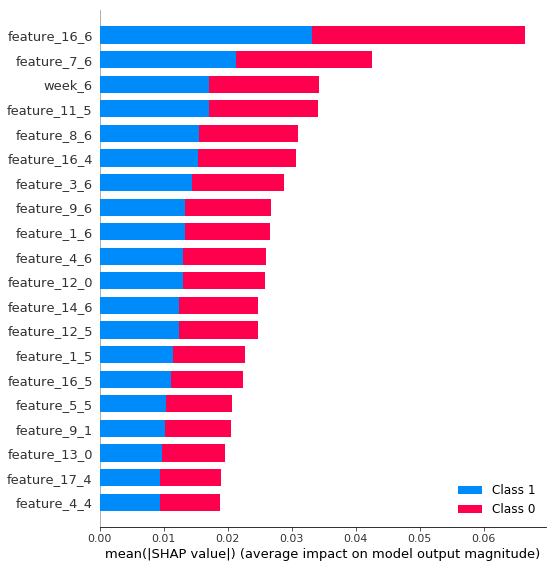

In [ ]:
#figure shows the SHAP feature importance for the random forest for predicting if courier curned or not. 
#SHAP values are ordered by decreasing importance and plotted below.


shap.summary_plot(shap_values, data_for_prediction)

##Stacked Classifier


####Classifier applied to individual weeks

As seen on weekly pair plots, there is some correlation between features seen in the final weeks, 
so I checked for best classifiers for each week. 

In [ ]:
week1 = []
week2 = []
week3 = []
week4 = []
week5 = []
week6 = []
week7 = []


for name in df_feat_importance.columns:
    if name.endswith("0"):
        week1.append(name)
    elif name.endswith("1"):
        week2.append(name)           
    elif name.endswith("2"):
        week3.append(name)        
    elif name.endswith("3"):
        week4.append(name)        
    elif name.endswith("4"):
        week5.append(name)        
    elif name.endswith("5"):
        week6.append(name)        
    elif name.endswith("6"):
        week7.append(name)        

    
df1 = df_feat_importance[week1]
df2 = df_feat_importance[week2]
df3 = df_feat_importance[week3]
df4 = df_feat_importance[week4]
df5 = df_feat_importance[week5]
df6 = df_feat_importance[week6]
df7 = df_feat_importance[week7]
        

    
df1.shape, df2.shape, df3.shape, df4.shape, df5.shape, df6.shape, df7.shape

((700, 18), (700, 18), (700, 18), (700, 18), (700, 18), (700, 18), (700, 18))

In [ ]:
from tpot import TPOTClassifier

Y = df_feat_importance['churned']

predictions_test = []
predictions_train = []
models = []

for df in [df1, df2, df3, df4, df5, df6, df7]:
    
    
    X= df.values
    imputer = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=-300)
    X = imputer.fit_transform(X)
    
    from sklearn.model_selection import train_test_split

    X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
    

    #it starts with 30 models from scikit learn, it optimizes them, it crosss validates amongst them all
    #for the next generation it choses the n best (defined by population_size) and optimizes them. 
    pipeline_optimizer = TPOTClassifier(generations=1, population_size=20, cv=5,
                                    random_state=42, verbosity=2)

    #does validation automatically 
    pipeline_optimizer.fit(X_train, y_train)
    print(pipeline_optimizer.score(X_val, y_val))   #predicts on validation set
    print(pipeline_optimizer.score(X_test, y_test)) #predicts on test set
    
    predictions_train.append(pipeline_optimizer.predict(X_val))
    predictions_test.append(pipeline_optimizer.predict(X_test))
    models.append(pipeline_optimizer)
    
   

Generation 1 - Current best internal CV score: 0.6073232323232324

Best pipeline: XGBClassifier(MaxAbsScaler(input_matrix), learning_rate=0.001, max_depth=9, min_child_weight=14, n_estimators=100, nthread=1, subsample=0.9000000000000001)
0.6071428571428571
0.6


Generation 1 - Current best internal CV score: 0.5873232323232322

Best pipeline: LogisticRegression(input_matrix, C=10.0, dual=False, penalty=l2)
0.6071428571428571
0.6


Generation 1 - Current best internal CV score: 0.6185353535353536

Best pipeline: LogisticRegression(input_matrix, C=25.0, dual=False, penalty=l1)
0.6607142857142857
0.5357142857142857


Generation 1 - Current best internal CV score: 0.6094949494949494

Best pipeline: XGBClassifier(MaxAbsScaler(input_matrix), learning_rate=0.001, max_depth=9, min_child_weight=14, n_estimators=100, nthread=1, subsample=0.9000000000000001)
0.5803571428571429
0.55


Generation 1 - Current best internal CV score: 0.6454040404040404

Best pipeline: XGBClassifier(MaxAbsScaler(input_matrix), learning_rate=0.001, max_depth=9, min_child_weight=14, n_estimators=100, nthread=1, subsample=0.9000000000000001)
0.6607142857142857
0.5714285714285714


Generation 1 - Current best internal CV score: 0.6606565656565657

Best pipeline: LinearSVC(MaxAbsScaler(input_matrix), C=10.0, dual=True, loss=squared_hinge, penalty=l2, tol=0.01)
0.6339285714285714
0.6285714285714286


Generation 1 - Current best internal CV score: 0.669141414141414

Best pipeline: RandomForestClassifier(input_matrix, bootstrap=True, criterion=entropy, max_features=0.4, min_samples_leaf=12, min_samples_split=3, n_estimators=100)
0.7053571428571429
0.6071428571428571


####Entire Dataset

In [ ]:
from tpot import TPOTClassifier

#it starts with 30 models from scikit learn, it optimizes them, it crosss validates amongst them all
#for the next generation it choses the n best (defined by population_size) and optimizes them. 
pipeline_optimizer = TPOTClassifier(generations=10, population_size=20, cv=5,
                                random_state=42, verbosity=2, config_dict='TPOT light')


Y = df_feat_importance['churned']
X = df_feat_importance.drop(['churned'], axis=1)

X = X.values


imputer = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=-300)
X = imputer.fit_transform(X)

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


#does validation automatically 
pipeline_optimizer.fit(X_train, y_train)

print(pipeline_optimizer.score(X_val, y_val)) #predicts on test set
print(pipeline_optimizer.score(X_test, y_test)) #predicts on test set

prediction_val = pipeline_optimizer.predict(X_val)
prediction_test = pipeline_optimizer.predict(X_test)

Generation 1 - Current best internal CV score: 0.7254545454545456

Best pipeline: KNeighborsClassifier(input_matrix, n_neighbors=100, p=2, weights=distance)
0.6696428571428571
0.6571428571428571


#### Both Stacked

All models from data for seperate weeks and model from the whole data set joined. This model has 8 features created from previous models.  

In [ ]:

features_predictions = np.hstack([X_val, np.array(predictions_train).T])
features_predictions_val = np.hstack([features_predictions, np.array(prediction_val).T.reshape(-1, 1)])

pipeline_optimizer = TPOTClassifier(generations=50, population_size=15, cv=5,
                                    random_state=42, verbosity=2, config_dict='TPOT light')

pipeline_optimizer.fit(features_predictions_val, y_val)


features_predictions_test = np.hstack([X_test, np.array(predictions_test).T])
features_predictions_test = np.hstack([features_predictions_test, np.array(prediction_test).T.reshape(-1, 1)])


pipeline_optimizer.score(features_predictions_test, y_test)

Generation 1 - Current best internal CV score: 0.6790513833992096
Generation 2 - Current best internal CV score: 0.6790513833992096
Generation 3 - Current best internal CV score: 0.6790513833992096
Generation 4 - Current best internal CV score: 0.6790513833992096
Generation 5 - Current best internal CV score: 0.6964426877470355
Generation 6 - Current best internal CV score: 0.6964426877470355
Generation 7 - Current best internal CV score: 0.6964426877470355
Generation 8 - Current best internal CV score: 0.6964426877470355
Generation 9 - Current best internal CV score: 0.6964426877470355
Generation 10 - Current best internal CV score: 0.6964426877470355
Generation 11 - Current best internal CV score: 0.6964426877470355
Generation 12 - Current best internal CV score: 0.6972332015810276
Generation 13 - Current best internal CV score: 0.7142292490118576
Generation 14 - Current best internal CV score: 0.7142292490118576
Generation 15 - Current best internal CV score: 0.7233201581027668
Gene

0.6357142857142857

#### Increasing the number of generations and population size. 

In [ ]:
from tpot import TPOTClassifier

#it starts with 30 models from scikit learn, it optimizes them, it crosss validates amongst them all
#for the next generation it choses the n best (defined by population_size) and optimizes them. 
pipeline_optimizer = TPOTClassifier(generations=100, population_size=15, cv=5,
                                random_state=3283782, verbosity=2)

#does validation automatically 
pipeline_optimizer.fit(X_train, y_train)
(pipeline_optimizer.score(X_test, y_test)) #predicts on test set

Generation 1 - Current best internal CV score: 0.72989898989899
Generation 2 - Current best internal CV score: 0.72989898989899
Generation 3 - Current best internal CV score: 0.72989898989899
Generation 4 - Current best internal CV score: 0.7432828282828283
Generation 5 - Current best internal CV score: 0.7432828282828283
Generation 6 - Current best internal CV score: 0.7432828282828283
Generation 7 - Current best internal CV score: 0.7455050505050506
Generation 8 - Current best internal CV score: 0.7455050505050506
Generation 9 - Current best internal CV score: 0.7478282828282828
Generation 10 - Current best internal CV score: 0.7478282828282828
Generation 11 - Current best internal CV score: 0.7478282828282828
Generation 12 - Current best internal CV score: 0.7478282828282828
Generation 13 - Current best internal CV score: 0.74989898989899
Generation 14 - Current best internal CV score: 0.74989898989899
Generation 15 - Current best internal CV score: 0.74989898989899
Generation 16 - 

0.7

# Comments

- The first thing to do would be to create the data sets models suggested by TPOT and evaluate the model using confusion matric, accuracy, f1 score, precision and recall. 

- As the dataset is quite small, deeplearning would probably overfit quite easily and would not be useful. 

- The uncertainty of predictions could also be checked by using many models to predict and then see how robust are the predictions (for example if we have 10 classifiers and 5 of them would predict '0' and 5 of them '1', we know that there is a lot of uncertainty involved, on the other hand if most models predicted '0' or '1', we know that the result is more robust)

- explore different tresholds by ussing ROC curve. 




#Weekly Pair Plots 

In [ ]:
a = pd.merge(df_churned, weekly_data_df_2, on='courier', how='inner')

a.head()

In [ ]:
df1_a = a.loc[a['week'] == 1]
plot2 = sns.pairplot(df1_a, height=2, hue="churned")

In [ ]:
df2_a = a.loc[a['week'] == 2]
plot4 = sns.pairplot(df2_a, height=2, hue="churned")

In [ ]:
df3_a = a.loc[a['week'] == 3]
plot5 = sns.pairplot(df3_a, height=2, hue="churned")

In [ ]:
df4_a = a.loc[a['week'] == 4]
plot6 = sns.pairplot(df4_a, height=2, hue="churned")

In [ ]:
df5_a = a.loc[a['week'] == 5]
plot7 = sns.pairplot(df5_a, height=2, hue="churned")

In [ ]:
df6_a = a.loc[a['week'] == 6]
plot8 = sns.pairplot(df6_a, height=2, hue="churned")

In [ ]:
df7_a = a.loc[a['week'] == 7]
plot9 = sns.pairplot(df7_a, height=2, hue="churned")